In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

In [4]:
!pip install --user seaborn

In [2]:
import torch


def sphere_to_torus(x):
    s = x.shape
    flipped_x = np.flip(x, axis=-2)
    prefix = s[:-2]
    n_theta, n_lam = s[-2], s[-1]
    output = np.zeros(prefix + (n_theta*2, n_lam))
    output[..., :n_theta, :] = x
    output[..., n_theta:, :n_lam//2] = flipped_x[..., :, n_lam//2:]
    output[..., n_theta:, n_lam//2:] = flipped_x[..., :, :n_lam//2]
    return output    

# def sphere_to_torus(x):
#     """ Performs a sphere to torus mapping for lat/long by reflecting and 
#     shifting the input so that both the x and y directions are periodic. 
#     """
#     s = x.shape
#     flipped_x = torch.flip(x, dims=(-3,))
#     prefix = s[:-3]
#     n_theta, n_lam, n_c = s[-3], s[-2], s[-1]
#     output = torch.zeros(prefix + (n_theta*2, n_lam, n_c))
#     output[..., :n_theta, :, :] = x
#     output[..., n_theta:, :n_lam//2, :] = flipped_x[..., :, n_lam//2:, :]
#     output[..., n_theta:, n_lam//2:, :] = flipped_x[..., :, :n_lam//2, :]
#     return output







In [379]:
start_t = torch.as_tensor(start.transpose(1, 2, 0))
print(start_t.shape)
sphere_to_torus_t(start_t).shape

torch.Size([720, 1440, 20])


(1440, 1440, 20)

In [59]:
start = data_truth1[0][0]
ex = sphere_to_torus(start)
c, h, w = ex.shape
ex_fft = np.fft.rfft(ex, axis=2, norm="ortho")
# bleh = ex_fft.transpose(1, 2, 0)
# W = np.random.randn(20, 20)

# bleh_out = np.einsum('hwi,io->hwo', bleh, W)
# ex_fft_out = np.fft.irfft2(bleh_out.transpose(2, 0, 1), s=(h, w), axes=(1,2), norm="ortho")






In [65]:
ex_fft.shape

(20, 1440, 721)

In [70]:
lat[::8]

(91,)

In [74]:
torch.cos(torch.linspace(-np.pi/2, np.pi/2, 90))

tensor([-4.3711e-08,  3.5291e-02,  7.0539e-02,  1.0570e-01,  1.4073e-01,
         1.7558e-01,  2.1021e-01,  2.4458e-01,  2.7865e-01,  3.1237e-01,
         3.4570e-01,  3.7860e-01,  4.1103e-01,  4.4295e-01,  4.7431e-01,
         5.0509e-01,  5.3523e-01,  5.6471e-01,  5.9348e-01,  6.2152e-01,
         6.4878e-01,  6.7523e-01,  7.0084e-01,  7.2558e-01,  7.4941e-01,
         7.7231e-01,  7.9425e-01,  8.1520e-01,  8.3513e-01,  8.5402e-01,
         8.7185e-01,  8.8859e-01,  9.0422e-01,  9.1873e-01,  9.3210e-01,
         9.4430e-01,  9.5532e-01,  9.6516e-01,  9.7379e-01,  9.8121e-01,
         9.8741e-01,  9.9238e-01,  9.9611e-01,  9.9860e-01,  9.9984e-01,
         9.9984e-01,  9.9860e-01,  9.9611e-01,  9.9238e-01,  9.8741e-01,
         9.8121e-01,  9.7379e-01,  9.6516e-01,  9.5532e-01,  9.4430e-01,
         9.3210e-01,  9.1873e-01,  9.0422e-01,  8.8859e-01,  8.7185e-01,
         8.5402e-01,  8.3513e-01,  8.1520e-01,  7.9425e-01,  7.7231e-01,
         7.4941e-01,  7.2558e-01,  7.0084e-01,  6.7

In [53]:
mask1 = (np.arange(1, h+1) % 2).reshape(1, -1, 1)
mask2 = (np.arange(1,w//2+1+1) % 2).reshape(1, 1, -1)


In [54]:
mask2.shape

(1, 1, 721)

In [265]:
%timeit -n 100 -r 50 sphere_to_torus2(ex_fft_out[:, :h//2, :w])

223 ms ± 18.2 ms per loop (mean ± std. dev. of 50 runs, 100 loops each)


In [137]:
ic=0

lat = np.flip(np.load('/pscratch/sd/s/shas1693/data/era5/latitude.npy'))
lon  = np.load('/pscratch/sd/s/shas1693/data/era5/longitude.npy')
midlat1 = np.arange(start=0,stop=360)
# print(midlat1)
midlat2= np.arange(start=360, stop=720)
# print(midlat2)
midlat = np.concatenate([midlat1,midlat2])
print(np.size(midlat,0))
# print(midlat)
# path2 ="/pscratch/sd/m/mmccabe/results/era5_wind/afno_backbone/0/inf_06_02/"
path1 ="/pscratch/sd/m/mmccabe/results/era5_wind/afno_backbone/baseline/"
# path1 ="/pscratch/sd/m/mmccabe/results/era5_wind/afno_backbone/2/"
# path1 = '/pscratch/sd/m/mmccabe/results/era5_wind/afno_backbone/freqfix_0/'
# path1 = '/pscratch/sd/m/mmccabe/results/era5_wind/afno_backbone_finetune/dfs_ft_2/'

# path2 = 
# path2 = "/pscratch/sd/s/shas1693/results/era5_wind/pretrained_two_step_afno_20ch_bs_64_lr1em4_blk_8_patch_8_cosine_sched/6/"
# path2 = "/pscratch/sd/s/shas1693/results/era5_wind/afno2_20ch_bs_512_pretrainnoise0.1_finetunenoise0.1_lr5em5/3/"
filename1 = path1+"autoregressive_predictions_z500.h5"
filename2 = path2+"autoregressive_predictions_z500.h5"
with h5py.File(filename1, "r") as f:
    # accs_dfs = f['acc'][0, :].T
    print(f.keys())
    data_truth1 = f['ground_truth'][ic:ic+1][:]
    data_pred1 = f['predicted'][ic:ic+1][:]
    acc = f['acc'][:]
print(data_pred1.shape)
# with h5py.File(filename2, "r") as f:
#     data_truth2 = f['ground_truth'][:]
#     data_pred2 = f['predicted'][:]

# with h5py.File(filename2, "r") as f:
#     accs_noise = f['acc'][0, :41].T
#     print(f.keys())
#     # data_truth1 = f['ground_truth'][ic:ic+1][:]
#     # data_pred1 = f['predicted'][ic:ic+1][:]
#     # acc = f['acc'][:]
# print(data_pred1.shape)

720
<KeysViewHDF5 ['acc', 'acc_coarse', 'acc_coarse_unweighted', 'acc_unweighted', 'ground_truth', 'predicted', 'rmse', 'rmse_coarse']>
(1, 41, 20, 720, 1440)


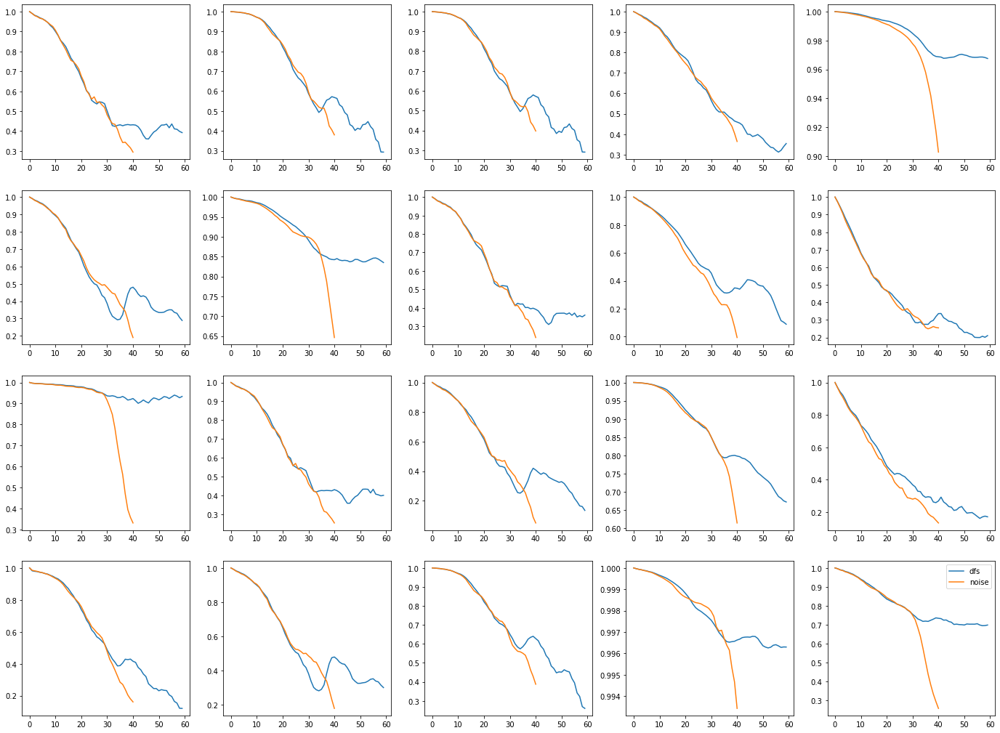

In [93]:
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(24, 18))

for i in range(20):
    col = i // 4
    row = i % 4
    axes[row][col].plot(accs_dfs[i], label='dfs')
    axes[row][col].plot(accs_noise[i], label='noise')       
plt.legend()

In [ ]:
[[1.         0.99196553 0.98328733 0.9794627  0.9728015  0.9692694
  0.9619185  0.9547798  0.942287   0.931301   0.9146847  0.898202
  0.8793449  0.8696565  0.8541676  0.8332331  0.80527556 0.79172885
  0.77102417 0.7525365  0.7269663  0.72435933 0.71454275 0.7145672
  0.6958208  0.6884131  0.6730093  0.66344196 0.63329417 0.6119197
  0.58915585 0.56756735 0.5406416  0.51416415 0.476004   0.44956347
  0.4351752  0.44908997 0.44477838 0.44337097 0.43185812]
 [1.         0.992621   0.98415685 0.9790438  0.97165805 0.96573484
  0.956984   0.9492789  0.9366158  0.92346483 0.9153727  0.9057083
  0.8868479  0.8712634  0.85558313 0.83602726 0.8107667  0.7890366
  0.76557046 0.7503383  0.72408956 0.6957632  0.66757035 0.6408492
  0.61732334 0.60412455 0.604509   0.5844053  0.5553529  0.54508597
  0.53240967 0.49947634 0.4834287  0.46881998 0.4410206  0.43442252
  0.4349003  0.4507893  0.47144037 0.46642727 0.45619074]
 [1.         0.9974695  0.99646986 0.99587464 0.9958889  0.9951158
  0.99448967 0.99406517 0.99404126 0.9931293  0.991945   0.9914562
  0.9914023  0.9903584  0.988946   0.9884517  0.9876691  0.9866478
  0.9845234  0.9827741  0.98114467 0.9783477  0.97368664 0.9715722
  0.9700859  0.96689504 0.96177375 0.9602534  0.9602012  0.95799786
  0.9539154  0.95465565 0.95896226 0.9599654  0.9574546  0.95859504
  0.96010613 0.95303607 0.9459061  0.9443969  0.9470892 ]
 [1.         0.9923978  0.99109155 0.990138   0.9878919  0.9866179
  0.98416394 0.98257643 0.97864467 0.97443336 0.9683803  0.9632716
  0.95494276 0.9449071  0.93244064 0.9213616  0.90722674 0.89190596
  0.8749318  0.85970366 0.8409144  0.82696587 0.8109142  0.8029565
  0.78581005 0.7779373  0.7645628  0.7597407  0.75286305 0.74514645
  0.7260737  0.7023303  0.6878282  0.6693909  0.6485156  0.6320613
  0.63000196 0.612524   0.59082323 0.5722998  0.55305225]
 [1.         0.9992458  0.9984044  0.99781364 0.99625    0.9951298
  0.9927894  0.9913668  0.98778576 0.9829303  0.9767787  0.97267354
  0.96559364 0.9557032  0.94340235 0.9325414  0.9179455  0.9020512
  0.88537294 0.871225   0.8513458  0.83612627 0.8207585  0.8109765
  0.79169255 0.7827932  0.76915246 0.7642196  0.75713146 0.7502671
  0.7306825  0.711197   0.70228475 0.68536943 0.66237056 0.64883494
  0.64922744 0.62995815 0.60209835 0.5856112  0.5708197 ]
 [1.         0.9980593  0.99661386 0.99600816 0.99466    0.9936307
  0.99250114 0.9924125  0.99142873 0.98989826 0.98851806 0.98698694
  0.98465043 0.98191625 0.97860414 0.9752866  0.97246253 0.96811986
  0.9640653  0.95878136 0.95511097 0.9520976  0.9496346  0.94749904
  0.94333816 0.940033   0.93666005 0.9353282  0.9323571  0.9291922
  0.9247482  0.9207801  0.91728276 0.9153741  0.9104656  0.90581304
  0.8997069  0.89327353 0.8853629  0.87883955 0.87345165]
 [1.         0.9922155  0.98379695 0.98011494 0.97353333 0.97006845
  0.96298003 0.9562041  0.9451308  0.9347312  0.9185415  0.90356433
  0.8870289  0.8779908  0.8626897  0.8437219  0.8154823  0.8000868
  0.77585196 0.75949967 0.7336848  0.72837055 0.7147625  0.7155781
  0.69782394 0.6930908  0.6796258  0.67007935 0.64171773 0.6196799
  0.59576803 0.5740712  0.5470821  0.52032876 0.4847755  0.46512353
  0.45308146 0.46209612 0.4536415  0.44891202 0.43844378]
 [1.         0.9929253  0.9844834  0.9795389  0.9725491  0.9667619
  0.9583844  0.9516052  0.9398438  0.92794853 0.92032695 0.91111565
  0.892154   0.87636316 0.86041814 0.83958286 0.8141406  0.79371303
  0.7709733  0.75472593 0.7330603  0.707144   0.6794468  0.6511647
  0.62968665 0.61605906 0.6144603  0.5940967  0.5663574  0.5519173
  0.5359936  0.5038307  0.4863229  0.46999544 0.44150394 0.43946236
  0.4345888  0.45141977 0.47391993 0.4784865  0.47282997]
 [1.         0.99921584 0.99832296 0.9976579  0.99595505 0.99483055
  0.99236333 0.9910191  0.98723423 0.98244894 0.9758653  0.9716118
  0.9642112  0.9542393  0.9414613  0.93049335 0.9153079  0.8989502
  0.8816197  0.86752236 0.8473219  0.8325175  0.81673354 0.8085391
  0.7897373  0.78188986 0.7685925  0.7645254  0.75681454 0.749535
  0.72998285 0.7098747  0.69976354 0.6830677  0.6615243  0.64963937
  0.65060616 0.63303816 0.60578704 0.5894402  0.5726729 ]
 [1.         0.99222547 0.9829586  0.978413   0.9708552  0.96735436
  0.9586542  0.9536778  0.9412796  0.9320246  0.9134488  0.89737475
  0.87642777 0.86710876 0.8525719  0.83852583 0.81472236 0.79916805
  0.7829068  0.76592034 0.74098873 0.7287675  0.7097527  0.6991147
  0.68129694 0.6781058  0.6631624  0.65068424 0.63321894 0.61440754
  0.5909722  0.5740259  0.5487943  0.5299445  0.49973765 0.47542155
  0.45553958 0.45291576 0.43344507 0.4280056  0.41693476]
 [1.         0.989891   0.9793652  0.9731298  0.96235585 0.958018
  0.9480223  0.93838215 0.92400426 0.9119042  0.8982767  0.8832615
  0.8686161  0.85461146 0.83223504 0.8194634  0.798534   0.7710713
  0.7439877  0.7243964  0.7058558  0.6761052  0.6326131  0.61353165
  0.603172   0.593375   0.597285   0.59228414 0.56547284 0.52158135
  0.51146    0.49516487 0.48418206 0.46119714 0.4389524  0.4408063
  0.4478639  0.45554203 0.47627652 0.46753064 0.42747095]
 [1.         0.9992188  0.9982852  0.9975077  0.9956373  0.9945447
  0.9923167  0.9909823  0.9872804  0.9823521  0.9762007  0.9717716
  0.96456665 0.95473415 0.9426801  0.93171746 0.91703457 0.902464
  0.8895975  0.87853247 0.86292833 0.85354304 0.8434963  0.8375319
  0.82340294 0.8192574  0.8091023  0.8054384  0.7970737  0.7886815
  0.77333385 0.75844574 0.74685216 0.73098713 0.7192324  0.71123934
  0.70656466 0.6887052  0.6680164  0.64796376 0.6240388 ]
 [1.         0.9944951  0.9882083  0.9830548  0.97496295 0.9702899
  0.9628327  0.9562913  0.94748634 0.9396712  0.93125623 0.9175239
  0.90146184 0.8936085  0.8825771  0.8660788  0.8488289  0.832228
  0.81875134 0.81049776 0.80400574 0.7993418  0.79084295 0.7788014
  0.7599466  0.7547425  0.7509852  0.7382127  0.7260181  0.7131253
  0.70123637 0.68708116 0.681683   0.674357   0.6615277  0.64756995
  0.62439734 0.60168666 0.588993   0.56850415 0.5602341 ]
 [1.         0.9900548  0.97792387 0.97162086 0.95979136 0.95192564
  0.94235325 0.93236315 0.9198474  0.90691423 0.89468944 0.88327324
  0.8674071  0.8493507  0.82619405 0.8029064  0.78474087 0.7617503
  0.73524445 0.7070863  0.68250585 0.66902065 0.6615303  0.6446157
  0.6253868  0.61252224 0.6017571  0.58166826 0.5600198  0.55877286
  0.54148674 0.5204736  0.5122115  0.5087788  0.49576855 0.47136122
  0.46045578 0.46757525 0.46368557 0.46574846 0.46086222]
 [1.         0.9997571  0.9994388  0.9989874  0.9983108  0.99766624
  0.99668455 0.9957696  0.9942844  0.99234474 0.989946   0.9878924
  0.985198   0.9814814  0.97635883 0.9712415  0.9651284  0.95916665
  0.9531855  0.9476454  0.9417051  0.93814474 0.9340987  0.93092716
  0.9272746  0.9263022  0.92360026 0.9212613  0.9179237  0.9125312
  0.90520704 0.9000265  0.89711344 0.89343774 0.8883753  0.88263595
  0.87584764 0.8670219  0.8563988  0.847191   0.83792037]
 [1.         0.99996966 0.9999453  0.99992853 0.99990416 0.9998818
  0.999849   0.9998286  0.99978775 0.9997434  0.9996952  0.9996585
  0.9996075  0.99954057 0.9994754  0.9994123  0.99933237 0.999237
  0.99912596 0.9990264  0.9989292  0.9988529  0.998759   0.9986733
  0.99860346 0.99852324 0.99844986 0.99837524 0.99833417 0.99831045
  0.99825525 0.9981914  0.9981183  0.9980251  0.9979007  0.9977502
  0.99757415 0.9974318  0.99733806 0.9972055  0.997157  ]
 [1.         0.99989134 0.9998232  0.9997371  0.99962187 0.9994884
  0.999327   0.99911505 0.9989084  0.9986297  0.9983471  0.99792
  0.9975471  0.9971122  0.99666846 0.99626243 0.9957482  0.995349
  0.994777   0.994477   0.9941441  0.9939758  0.9934087  0.99294335
  0.99246824 0.9920922  0.99169415 0.9911822  0.9908961  0.99031514
  0.98951846 0.9887104  0.98806405 0.9871823  0.98617786 0.98505455
  0.9841145  0.9835509  0.98269904 0.9821514  0.9819418 ]
 [1.         0.9756239  0.9488936  0.9212278  0.8906176  0.8634168
  0.8350333  0.8069621  0.78336954 0.7519552  0.7199867  0.7026566
  0.68270224 0.6610277  0.63306755 0.611759   0.59194267 0.5663475
  0.5366166  0.52692544 0.51630235 0.49968156 0.48528945 0.47614768
  0.4696442  0.44558448 0.42156348 0.40254804 0.39085823 0.38122654
  0.37888902 0.38130274 0.37510115 0.37712303 0.37522015 0.35914686
  0.34091076 0.32982826 0.32625252 0.3352703  0.3474178 ]
 [1.         0.9713239  0.9449545  0.92669964 0.90247416 0.87693137
  0.8545511  0.841055   0.8284388  0.8034209  0.7787669  0.7578392
  0.73735213 0.7124191  0.68464607 0.66163385 0.64122224 0.61147213
  0.58001435 0.55051154 0.5302668  0.50915116 0.49732542 0.47774145
  0.47887337 0.48633796 0.47931546 0.4770436  0.46300656 0.445573
  0.43296677 0.4187015  0.4041084  0.40631366 0.37597924 0.36966485
  0.36198527 0.35970446 0.3346316  0.3227559  0.30990288]
 [1.         0.9965671  0.9912907  0.9885332  0.98311126 0.98000354
  0.97486436 0.9704967  0.9642948  0.9581219  0.94999176 0.94407123
  0.9353245  0.92842734 0.9199152  0.91348183 0.9038083  0.8921528
  0.88024205 0.8715463  0.8627543  0.8574635  0.8529798  0.85165507
  0.8463379  0.843303   0.83613765 0.82825536 0.8187989  0.8099536
  0.8018506  0.79235023 0.7786157  0.7741201  0.76524454 0.7592103
  0.7523878  0.7542104  0.7537573  0.7538616  0.7457327 ]]

(1, 41, 20, 720, 1440) (1, 41, 20, 720, 1440)


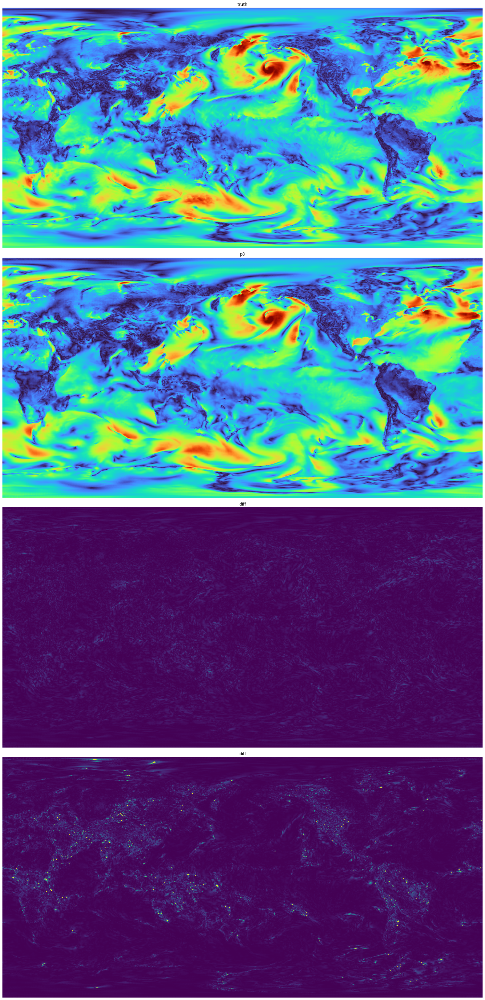

In [139]:


print(data_pred1.shape, data_truth1.shape)

t = 1
u10_p8_full = np.sqrt(data_pred1[0,:,0]**2 + data_pred1[0,:,1]**2)
u10_p4_full = np.sqrt(data_truth1[0,:,0]**2 + data_truth1[0,:,1]**2)
highest_err_ind = np.abs(u10_p8_full-u10_p4_full)[9].argmax()
err_x = highest_err_ind // 1440
err_y = highest_err_ind % 1440
T = data_truth1.shape[1]


def snapshot_viz(data_pred1, data_truth1, t):
    
    u10_p8_full = np.sqrt(data_pred1[0,:,0]**2 + data_pred1[0,:,1]**2)
    u10_p4_full = np.sqrt(data_truth1[0,:,0]**2 + data_truth1[0,:,1]**2)
    # u10_p8_full = np.sqrt(data_pred1[0,:,0]**2 + data_pred1[0,:,1]**2)
    # u10_p4_full = np.sqrt(data_truth1[0,:,0]**2 + data_truth1[0,:,1]**2)
    vmax = np.percentile(u10_p4_full, 99.9)
    vmin = np.percentile(u10_p4_full, .1)

    dev = np.abs(u10_p8_full-u10_p4_full)
    diff_max, diff_min = (np.percentile(dev, 99.9),
                          np.percentile(dev, .1) )
    rel_err = np.abs(dev)/(np.abs(u10_p4_full)+1e-5)
    err_max, err_min = (np.percentile(rel_err, 99),
                          np.percentile(rel_err, 1) )


    u10_p8 = np.sqrt(data_pred1[0,t,0]**2 + data_pred1[0,t,1]**2)
    u10_p4 = np.sqrt(data_truth1[0,t,0]**2 + data_truth1[0,t,1]**2)
    dev = u10_p8-u10_p4

    rel_err = np.abs(dev)/(np.abs(u10_p4)+1e-5)
    fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(60,40))
    ax[0].imshow(u10_p4, cmap="turbo", vmax=vmax, vmin=vmin)
    ax[0].set_title("truth")
    ax[0].axis('off')
    ax[1].imshow(u10_p8, cmap="turbo", vmax=vmax, vmin=vmin)
    ax[1].set_title("p8")
    ax[1].axis('off')

    ax[2].imshow(np.abs(dev), vmax=diff_max, vmin=diff_min)
    ax[2].set_title("diff")
    ax[2].axis('off')
    
    ax[3].imshow(rel_err, vmax=err_max, vmin=err_min)
    ax[3].set_title("diff")
    ax[3].axis('off')
    plt.tight_layout()
    return fig

k = 256
fig = snapshot_viz(data_pred1, data_truth1, t)

# fig.savefig("./comp.pdf", format="pdf", dpi=1200, bbox_inches="tight")

712 1427


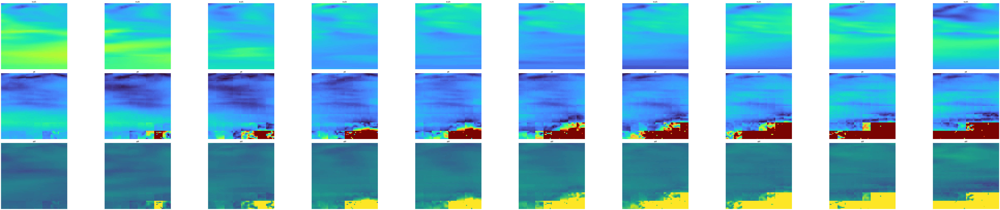

In [143]:
def patch_sequence(data_pred1, data_truth1, x = 580, y=950, k=128,
                   t=0, t_end=None):
    if t_end is None:
        t_end = t+10
    duration = t_end - t
    lb_x = min(720-k, max(0, x-k//2))
    lb_y = min(1440-k, max(0, y-k//2))
        
    u10_p8_full = np.sqrt(data_pred1[0,:,0]**2 + data_pred1[0,:,1]**2)
    u10_p4_full = np.sqrt(data_truth1[0,:,0]**2 + data_truth1[0,:,1]**2)
    vmax = np.percentile(u10_p4_full, 99.9)
    vmin = np.percentile(u10_p4_full, .1)

    diff_max, diff_min = (np.percentile(u10_p8_full-u10_p4_full, 99.9),
                          np.percentile(u10_p8_full-u10_p4_full, .1) )
    
    
    fig, ax = plt.subplots(nrows=3, ncols=duration, figsize=(duration*10,20))

    for i in range(duration):
        u10_p8 = np.sqrt(data_pred1[0,t+i,0, lb_x:lb_x+k, lb_y:lb_y+k]**2 + data_pred1[0,t+i,1,lb_x:lb_x+k, lb_y:lb_y+k]**2)
        u10_p4 = np.sqrt(data_truth1[0,t+i,0,lb_x:lb_x+k, lb_y:lb_y+k]**2 + data_truth1[0,t+i,1,lb_x:lb_x+k, lb_y:lb_y+k]**2)
        ax[0][i].imshow(u10_p4, cmap="turbo", vmax=vmax, vmin=vmin)
        ax[0][i].set_title("truth")
        ax[0][i].axis('off')
        ax[1][i].imshow(u10_p8, cmap="turbo", vmax=vmax, vmin=vmin)
        ax[1][i].set_title("p8")
        ax[1][i].axis('off')

        ax[2][i].imshow(u10_p8 - u10_p4, vmax=diff_max, vmin=diff_min)
        ax[2][i].set_title("diff")
        ax[2][i].axis('off')
    plt.tight_layout()
    return fig

err_time = 35

# u10_p8_full = np.sqrt(data_pred1[0,:,0]**2 + data_pred1[0,:,1]**2)
# u10_p4_full = np.sqrt(data_truth1[0,:,0]**2 + data_truth1[0,:,1]**2)
u10_p8_full = data_pred1[0,:,11]
u10_p4_full = data_truth1[0,:,11]
highest_err_ind = np.abs(u10_p8_full-u10_p4_full)[err_time].argmax()
highest_rel_err_ind = (np.abs(u10_p8_full-u10_p4_full)/(1e-5+np.abs(u10_p4_full)))[err_time].argmax()

err_x = highest_err_ind // 1440
err_y = highest_err_ind % 1440

print(err_x, err_y)
fig = patch_sequence(data_pred1, data_truth1, x=err_x, y = err_y, k=64, t=25)

In [141]:
def compute_spectra(data_truth, data_pred, ch=0):
    data_truth = (np.asarray(data_truth))
    data_pred = (np.asarray(data_pred))
    midlat = np.arange(data_truth.shape[-2])
    Z500_truth = np.squeeze(data_truth[:,:,11,:,:])
    Z500_pred = np.squeeze(data_pred[:,:,11,:,:])
    # Z500_truth = np.squeeze(np.sqrt(data_truth[:,:,0,:,:]**2 + data_truth[:,:,1,:,:]**2))
    # Z500_pred = np.squeeze(np.sqrt(data_pred[:,:,0,:,:]**2 + data_pred[:,:,1,:,:]**2))
    err = Z500_pred - Z500_truth
    print(Z500_truth.shape, Z500_pred.shape, err.shape)

    # print(Z500_truth.shape, Z500_pred.shape)
    dt_sample = 1;
    total_t = T

    Z_fft_pred = np.zeros([int(total_t/dt_sample),int(np.size(midlat,0)),int(np.size(Z500_pred,2)/2)+1])
    Z_fft_truth = np.zeros([int(total_t/dt_sample),int(np.size(midlat,0)),int(np.size(Z500_truth,2)/2)+1])
    err_fft = np.zeros([int(total_t/dt_sample),int(np.size(midlat,0)),int(np.size(Z500_truth,2)/2)+1])

    print('shape of Z_fft_pred', np.shape(Z_fft_pred))

    for t_idx,k in enumerate(range(0,total_t,dt_sample)):
        for lat_idx,i in enumerate(midlat):  
            Z_fft_pred[t_idx,lat_idx,:] = np.abs(np.fft.rfft(np.squeeze(Z500_pred[k,i,:])))  
            Z_fft_truth[t_idx, lat_idx,:] = np.abs(np.fft.rfft(np.squeeze(Z500_truth[k,i,:])))
            err_fft[t_idx, lat_idx,:] = np.abs(np.fft.rfft(np.squeeze(err[k,i,:])))
    Z_fft_pred_mean = np.squeeze(np.mean(Z_fft_pred,axis =1))            
    Z_fft_truth_mean = np.squeeze(np.mean(Z_fft_truth,axis=1))
    Z_fft_err_mean = np.squeeze(np.mean(err_fft,axis=1))
    
    return Z_fft_truth_mean, Z_fft_pred_mean, Z_fft_truth, Z_fft_pred, Z_fft_err_mean, err_fft


(41, 720, 1440) (41, 720, 1440) (41, 720, 1440)
shape of Z_fft_pred (41, 720, 721)
(41, 1440, 720) (41, 1440, 720) (41, 1440, 720)
shape of Z_fft_pred (41, 1440, 361)
(41, 721)


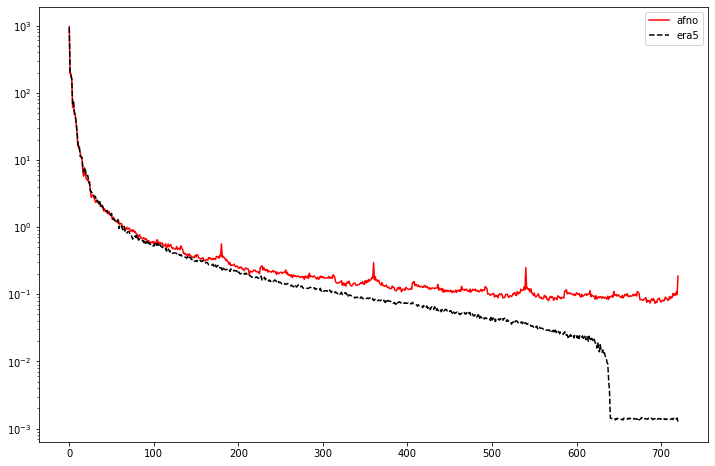

In [142]:
ch=0
p8_truth_mean, p8_pred_mean, p8_fft_truth, p8_fft_pred, p8_fft_err_mean, p8_fft_err = compute_spectra(data_truth1, data_pred1, ch=ch)
p8_truth_mean_t, p8_pred_mean_t, p8_fft_truth_t, p8_fft_pred_t, p8_fft_err_mean_t, p8_fft_err_t = compute_spectra(data_truth1.swapaxes(-1, -2), data_pred1.swapaxes(-1, -2), ch=ch)

# p4_truth_mean, p4_pred_mean, p4_fft_pred = compute_spectra(data_truth2, data_pred2, ch=ch)
print(p8_pred_mean.shape)
k_wav= np.arange(start=0,stop=np.size(p8_fft_pred,2))
c = ["r-", "g-"]
t = 10
fig, ax = plt.subplots(figsize=(12, 8))
for idx,k in enumerate(range(t,t+1)):
    plt.semilogy(k_wav,p8_pred_mean[k,:], c[idx])
    # plt.semilogy(k_wav,p4_pred_mean[k,:], c[idx+1])
    plt.semilogy(k_wav,p8_truth_mean[k,:], 'k--')
    # plt.semilogy(k_wav,p8_fft_err_mean[k,:])
# plt.legend(["p8", "p4", "era5"])
plt.legend(["afno", "era5", 'err'])
# plt.savefig("./compspectra_t{}.pdf".format(t), format="pdf", dpi=1200, bbox_inches="tight")

(60, 721)


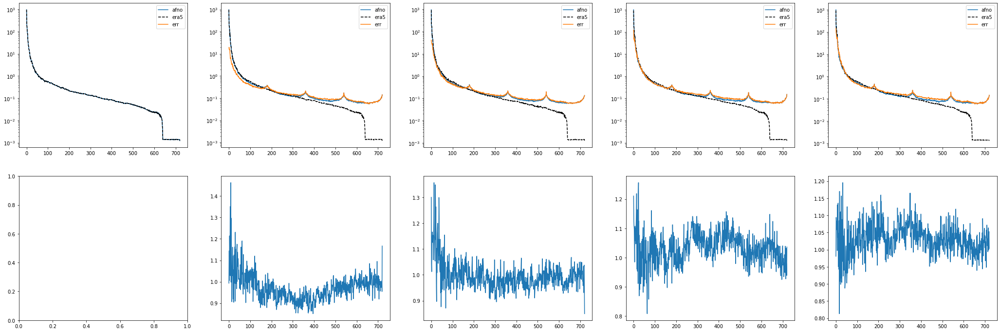

In [131]:
ch=0
# p8_truth_mean, p8_pred_mean, p8_fft_truth, p8_fft_pred, p8_fft_err_mean, p8_fft_err = compute_spectra(data_truth1.swapaxes(-1, -2), data_pred1.swapaxes(-1, -2), ch=ch)
# p4_truth_mean, p4_pred_mean, p4_fft_pred = compute_spectra(data_truth2, data_pred2, ch=ch)
print(p8_pred_mean.shape)
k_wav= np.arange(start=0,stop=np.size(p8_fft_pred,2))
c = ["r-", "g-"]
t = 0
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(36, 12))
for idx,k in enumerate(range(t,t+25, 5)):
    ax[0][idx].semilogy(k_wav,p8_pred_mean[k,:])
    ax[0][idx].semilogy(k_wav,p8_truth_mean[k,:], 'k--')
    ax[0][idx].semilogy(k_wav,p8_fft_err_mean[k,:])
    ax[0][idx].legend(["afno", "era5", 'err'])

    # ax[1][idx].semilogy(k_wav,p8_pred_mean[k,:])
    # ax[1][idx].semilogy(k_wav,p8_truth_mean[k,:], 'k--')
    # ax[1][idx].plot(k_wav,p8_fft_err_mean[k,:]/(p8_truth_mean[k,:]+1e-5))
    # ax[1][idx].semilogy(k_wav,p8_fft_err_mean[k,:])

    if k > 1:
        ax[1][idx].plot(k_wav,p8_fft_err_mean[k,:] / (p8_fft_err_mean[k-1,:]+1e-5))
        
    

# plt.legend(["p8", "p4", "era5"])
# plt.savefig("./compspectra_t{}.pdf".format(t), format="pdf", dpi=1200, bbox_inches="tight")

(60, 721)


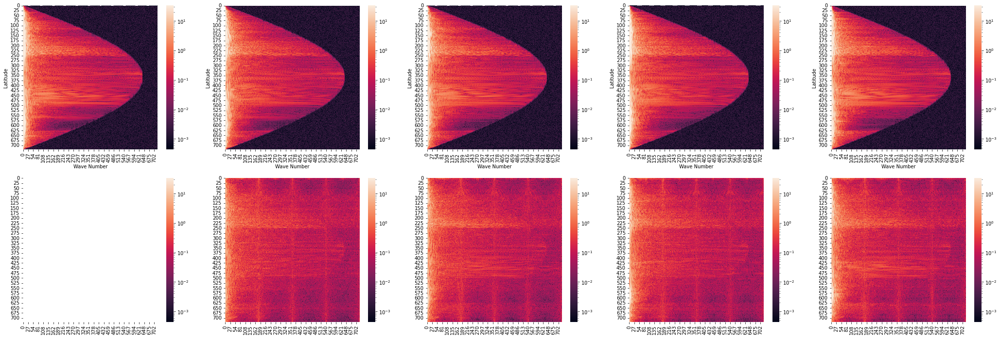

In [132]:
ch=0
# p8_truth_mean, p8_pred_mean, p8_fft_truth, p8_fft_pred, p8_fft_err_mean, p8_fft_err = compute_spectra(data_truth1.swapaxes(-1, -2), data_pred1.swapaxes(-1, -2), ch=ch)
# p4_truth_mean, p4_pred_mean, p4_fft_pred = compute_spectra(data_truth2, data_pred2, ch=ch)
print(p8_pred_mean.shape)
k_wav= np.arange(start=0,stop=np.size(p8_fft_pred,2))
c = ["r-", "g-"]
t = 0
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(36, 12))
for idx,k in enumerate(range(t,t+10, 2)):
    
    # sns.heatmap(p8_fft_err_mean.T, 
    #             norm=colors.LogNorm(vmin=np.percentile(p8_fft_err_mean, 3), vmax=np.percentile(p8_fft_err_mean, 99)),
    #            ax=axes[2])
    sns.heatmap(p8_fft_truth[k], 
                norm=colors.LogNorm(vmin=np.percentile(p8_fft_truth, 3), vmax=np.percentile(p8_fft_truth, 99)),
               ax=axes[0][idx])
    axes[0][idx].set_xlabel('Wave Number')
    axes[0][idx].set_ylabel('Latitude')
    sns.heatmap(p8_fft_err[k], 
                norm=colors.LogNorm(vmin=np.percentile(p8_fft_truth, 3), vmax=np.percentile(p8_fft_truth, 99)),
               ax=axes[1][idx])
    # ax[0][idx].semilogy(k_wav,p8_pred_mean[k,:])
    # ax[0][idx].semilogy(k_wav,p8_truth_mean[k,:], 'k--')
    # ax[0][idx].semilogy(k_wav,p8_fft_err_mean[k,:])
    # ax[0][idx].legend(["afno", "era5", 'err'])

    # ax[1][idx].semilogy(k_wav,p8_pred_mean[k,:])
    # ax[1][idx].semilogy(k_wav,p8_truth_mean[k,:], 'k--')
    # ax[1][idx].plot(k_wav,p8_fft_err_mean[k,:]/(p8_truth_mean[k,:]+1e-5))
    # ax[1][idx].semilogy(k_wav,p8_fft_err_mean[k,:])

    # if k > 1:
    #     ax[1][idx].plot(k_wav,p8_fft_err_mean[k,:] / (p8_fft_err_mean[k-1,:]+1e-5))
        
    

# plt.legend(["p8", "p4", "era5"])
# plt.savefig("./compspectra_t{}.pdf".format(t), format="pdf", dpi=1200, bbox_inches="tight")

(60, 721)


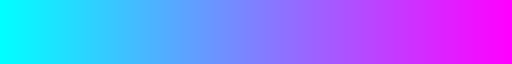

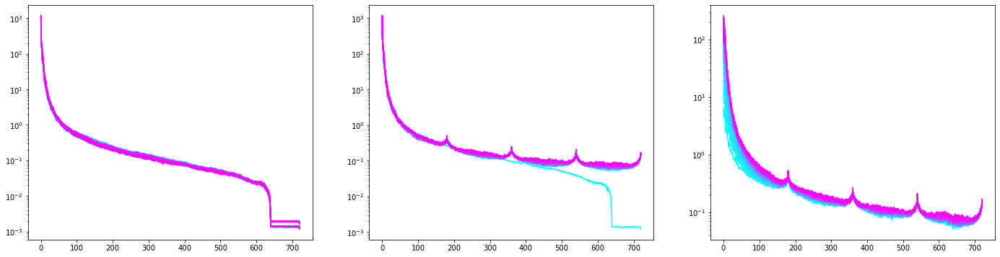

In [133]:
ch=0
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable


cmap = cm.get_cmap('cool')
# p8_truth_mean, p8_pred_mean, p8_fft_truth, p8_fft_pred, p8_fft_err_mean, _ = compute_spectra(data_truth1.swapaxes(-1, -2), data_pred1.swapaxes(-1, -2), ch=ch)
# p4_truth_mean, p4_pred_mean, p4_fft_pred = compute_spectra(data_truth2, data_pred2, ch=ch)
print(p8_pred_mean.shape)
k_wav= np.arange(start=0,stop=np.size(p8_fft_pred,2))
c = ["r-", "g-"]
t = 10
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24, 6))
for idx,k in enumerate(range(0,T)):
    # plt.semilogy(k_wav,p8_pred_mean[k,:])
    ax[0].semilogy(k_wav,p8_truth_mean[k,:],color=cmap(idx/T))
    # plt.semilogy(k_wav,p8_fft_err_mean[k,:], color=cmap(idx/40) )
    
for idx,k in enumerate(range(0,T)):
    ax[1].semilogy(k_wav,p8_pred_mean[k,:], color=cmap(idx/T))
    # plt.semilogy(k_wav,p8_truth_mean[k,:], 'k--')
    # plt.semilogy(k_wav,p8_fft_err_mean[k,:], color=cmap(idx/40) )
    
for idx,k in enumerate(range(0,T)):
    # plt.semilogy(k_wav,p8_pred_mean[k,:])
    # plt.semilogy(k_wav,p8_truth_mean[k,:], 'k--')
    last_plot = ax[2].semilogy(k_wav,p8_fft_err_mean[k,:], color=cmap(idx/T) )
    
# divider = make_axes_locatable(ax[2])
# cax = divider.append_axes('right', size='5%', pad=0.05)
# plt.colorbar(last_plot,cax=cax)
# plt.legend(["p8", "p4", "era5"])
# plt.legend(["afno", "era5", 'err'])
cmap

(60, 721)


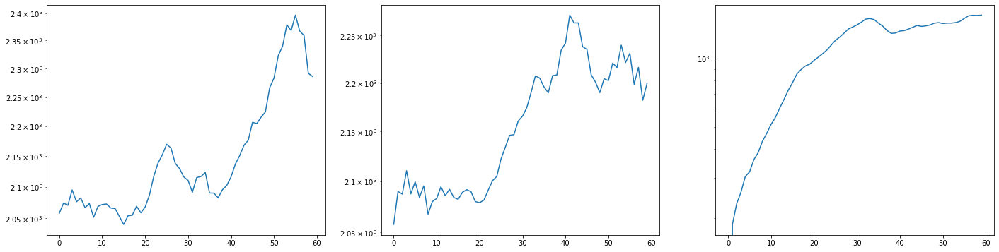

In [134]:
ch=0
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable


cmap = cm.get_cmap('cool')
# p4_truth_mean, p4_pred_mean, p4_fft_pred = compute_spectra(data_truth2, data_pred2, ch=ch)
print(p8_pred_mean.shape)
k_wav= np.arange(start=0,stop=np.size(p8_fft_pred,2))
time = np.arange(T)
c = ["r-", "g-"]
t = 10
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24, 6))
    # plt.semilogy(k_wav,p8_pred_mean[k,:])
ax[0].semilogy(time,p8_truth_mean.sum(1))
    # plt.semilogy(k_wav,p8_fft_err_mean[k,:], color=cmap(idx/40) )
    

ax[1].semilogy(time,p8_pred_mean.sum(1))
    # plt.semilogy(k_wav,p8_truth_mean[k,:], 'k--')
    # plt.semilogy(k_wav,p8_fft_err_mean[k,:], color=cmap(idx/40) )
    
    # plt.semilogy(k_wav,p8_pred_mean[k,:])
    # plt.semilogy(k_wav,p8_truth_mean[k,:], 'k--')
last_plot = ax[2].semilogy(time,p8_fft_err_mean.sum(1))
    
# divider = make_axes_locatable(ax[2])
# cax = divider.append_axes('right', size='5%', pad=0.05)
# plt.colorbar(last_plot,cax=cax)
# plt.legend(["p8", "p4", "era5"])
# plt.legend(["afno", "era5", 'err'])

Text(0.5, 1.0, 'Err Spectrum')

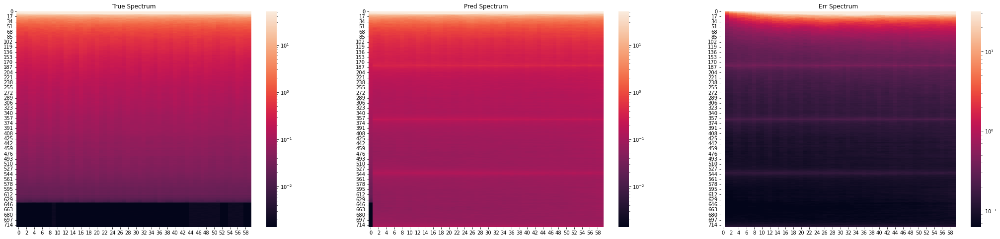

In [135]:
import seaborn as sns
import matplotlib.colors as colors
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(36, 8))
sns.heatmap(p8_fft_err_mean.T, 
            norm=colors.LogNorm(vmin=np.percentile(p8_fft_err_mean, 3), vmax=np.percentile(p8_fft_err_mean, 99)),
           ax=axes[2])
sns.heatmap(p8_truth_mean.T, 
            norm=colors.LogNorm(vmin=np.percentile(p8_truth_mean, 3), vmax=np.percentile(p8_truth_mean, 99)),
           ax=axes[0])
sns.heatmap(p8_pred_mean.T, 
            norm=colors.LogNorm(vmin=np.percentile(p8_truth_mean, 3), vmax=np.percentile(p8_truth_mean, 99)),
           ax=axes[1])

axes[0].set_title("True Spectrum")
axes[1].set_title("Pred Spectrum")
axes[2].set_title("Err Spectrum")
           # fig_size=(12, 8))

Text(0.5, 1.0, 'Err Spectrum')

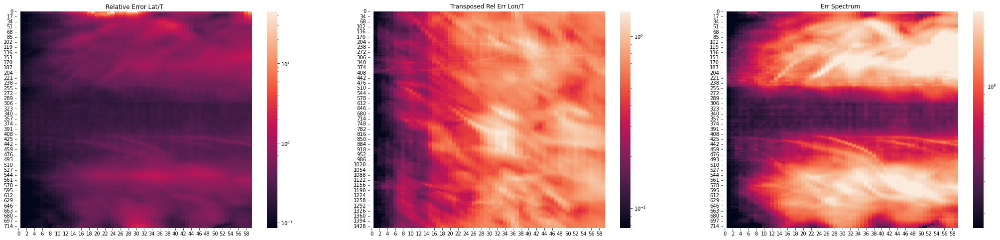

In [136]:
import seaborn as sns
import matplotlib.colors as colors
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(36, 8))

sns.heatmap(p8_fft_err.sum(2).T / (1e-5+p8_fft_truth.sum(2).T), 
            norm=colors.LogNorm(vmin=np.percentile(p8_fft_err.sum(2).T / (1e-5+p8_fft_truth.sum(2).T), 3), 
                                                   vmax=np.percentile(p8_fft_err.sum(2).T / (1e-5+p8_fft_truth.sum(2).T), 99.99)),
           ax=axes[0])

sns.heatmap(p8_fft_err_t.sum(2).T / (1e-5+p8_fft_truth_t.sum(2).T), 
            norm=colors.LogNorm(vmin=np.percentile(p8_fft_err_t.sum(2).T / (1e-5+p8_fft_truth_t.sum(2).T), 3), 
                                                   vmax=np.percentile(p8_fft_err_t.sum(2).T / (1e-5+p8_fft_truth_t.sum(2).T), 99.99)),
           ax=axes[1])

sns.heatmap(p8_fft_err.sum(2).T, 
            norm=colors.LogNorm(vmin=np.percentile(p8_fft_err.sum(2), 3), vmax=np.percentile(p8_fft_err.sum(2), 95)),
           ax=axes[2])

axes[0].set_title("Relative Error Lat/T")
axes[1].set_title("Transposed Rel Err Lon/T")
axes[2].set_title("Err Spectrum")
           # fig_size=(12, 8))

<KeysViewHDF5 ['acc', 'acc_coarse', 'acc_coarse_unweighted', 'acc_unweighted', 'ground_truth', 'predicted', 'rmse', 'rmse_coarse']>
(60, 720, 1440) (60, 720, 1440) (60, 720, 1440)
shape of Z_fft_pred (60, 720, 721)
(60, 1440, 720) (60, 1440, 720) (60, 1440, 720)
shape of Z_fft_pred (60, 1440, 361)
<KeysViewHDF5 ['acc', 'acc_coarse', 'acc_coarse_unweighted', 'acc_unweighted', 'ground_truth', 'predicted', 'rmse', 'rmse_coarse']>
(60, 720, 1440) (60, 720, 1440) (60, 720, 1440)
shape of Z_fft_pred (60, 720, 721)
(60, 1440, 720) (60, 1440, 720) (60, 1440, 720)
shape of Z_fft_pred (60, 1440, 361)
<KeysViewHDF5 ['acc', 'acc_coarse', 'acc_coarse_unweighted', 'acc_unweighted', 'ground_truth', 'predicted', 'rmse', 'rmse_coarse']>
(60, 720, 1440) (60, 720, 1440) (60, 720, 1440)
shape of Z_fft_pred (60, 720, 721)
(60, 1440, 720) (60, 1440, 720) (60, 1440, 720)
shape of Z_fft_pred (60, 1440, 361)
<KeysViewHDF5 ['acc', 'acc_coarse', 'acc_coarse_unweighted', 'acc_unweighted', 'ground_truth', 'predict

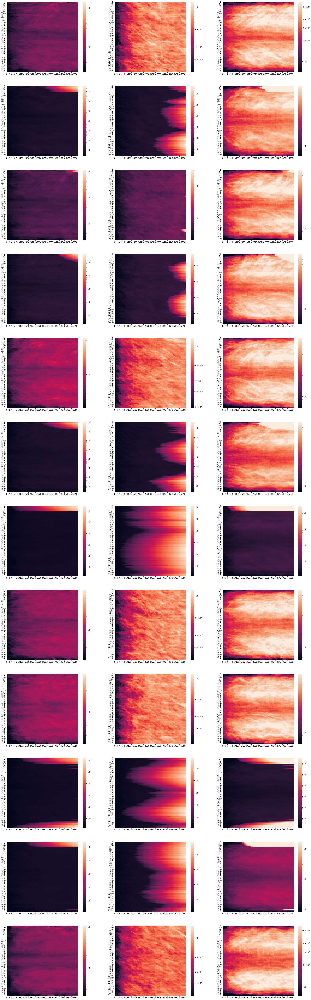

In [124]:
ch = 0 
def plot_all_ic_errs():
    fig, axes = plt.subplots(nrows=12, ncols=3, figsize=(30, 100))
    for ic in range(12):
        with h5py.File(filename1, "r") as f:
            print(f.keys())
            data_truth1 = f['ground_truth'][ic:ic+1][:]
            data_pred1 = f['predicted'][ic:ic+1][:]
            acc = f['acc'][:]

        u10_p8_full = np.sqrt(data_pred1[0,:,0]**2 + data_pred1[0,:,1]**2)
        u10_p4_full = np.sqrt(data_truth1[0,:,0]**2 + data_truth1[0,:,1]**2)
        p8_truth_mean, p8_pred_mean, p8_fft_truth, p8_fft_pred, p8_fft_err_mean, p8_fft_err = compute_spectra(data_truth1, data_pred1, ch=ch)
        p8_truth_mean_t, p8_pred_mean_t, p8_fft_truth_t, p8_fft_pred_t, p8_fft_err_mean_t, p8_fft_err_t = compute_spectra(data_truth1.swapaxes(-1, -2), data_pred1.swapaxes(-1, -2), ch=ch)

        sns.heatmap(p8_fft_err.sum(2).T / (1e-5+p8_fft_truth.sum(2).T), 
                norm=colors.LogNorm(vmin=np.percentile(p8_fft_err.sum(2).T / (1e-5+p8_fft_truth.sum(2).T), 3), 
                                                       vmax=np.percentile(p8_fft_err.sum(2).T / (1e-5+p8_fft_truth.sum(2).T), 99.99)),
               ax=axes[ic][0])

        sns.heatmap(p8_fft_err_t.sum(2).T / (1e-5+p8_fft_truth_t.sum(2).T), 
                    norm=colors.LogNorm(vmin=np.percentile(p8_fft_err_t.sum(2).T / (1e-5+p8_fft_truth_t.sum(2).T), 3), 
                                                           vmax=np.percentile(p8_fft_err_t.sum(2).T / (1e-5+p8_fft_truth_t.sum(2).T), 99.99)),
                   ax=axes[ic][1])

        sns.heatmap(p8_fft_err.sum(2).T, 
                    norm=colors.LogNorm(vmin=np.percentile(p8_fft_err.sum(2), 3), vmax=np.percentile(p8_fft_err.sum(2), 95)),
                   ax=axes[ic][2])
    return fig
fig = plot_all_ic_errs()